# Quantifying semisc similarity
## Chapter X: Data sequence analysis

### Author: Anders Kampenes

### Dimension reduction and visualization with PCA

In [ ]:
### Loading and preparing dataset

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pylab as plt 
from sklearn.datasets import load_digits 
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
#load  seimsic data
data_cube = np.load("/Users/anderskampenes/Documents/Dokumenter/NTNU/MASTER/code/data/raw/f3-benchmark/test_once/test1_seismic.npy")

print("img shape", data_cube.shape)

# define directions 
directions = ["inline", "xline", "tline"]
inline_samples, xline_samples, tline_samples = data_cube.shape
print(inline_samples, xline_samples, tline_samples)
data = {}
labels = {}
num_samples = {}

num_samples["inline"] = inline_samples
data["inline"] = data_cube
labels["inline"] = np.arange(0,inline_samples)

num_samples["xline"] = xline_samples
data["xline"] = np.transpose(data_cube, (1,0,2))
labels["xline"] = np.arange(0,xline_samples)


num_samples["tline"] = tline_samples
data["tline"] = np.transpose(data_cube, (2,1,0))
labels["tline"] = np.arange(0,tline_samples)

#print("labels", labels["inline"], labels["xline"], labels["tline"])


img shape (200, 701, 255)
200 701 255


39


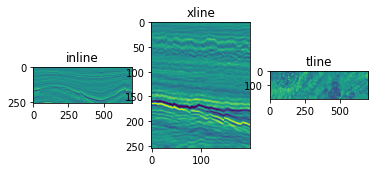

In [4]:


# plt different slices 
fig, (ax1, ax2, ax3) = plt.subplots(1, 3)

random_slice = np.random.choice(100, 1)[0]
print(random_slice)
ax1.imshow(data["inline"][random_slice].T)
ax1.set_title('inline')

ax2.imshow(data["xline"][random_slice].T)
ax2.set_title('xline')

ax3.imshow(data["tline"][random_slice].T)
ax3.set_title('tline')

plt.show()

   

In [6]:
"""
We see that inline and xline directions have clear stacking patterns, 
but the tline is more meshy.

Intuitivly, we would could easily see more clear pattern change in iline/xline direction 
"""

'\nWe see that inline and xline directions have clear stacking patterns, \nbut the tline is more meshy.\n\nIntuitivly, we would could easily see more clear pattern change in iline/xline direction \n'

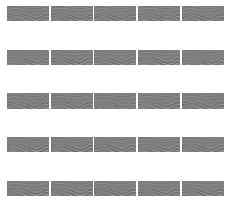

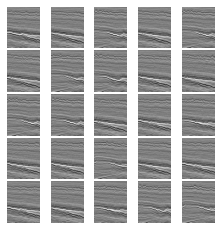

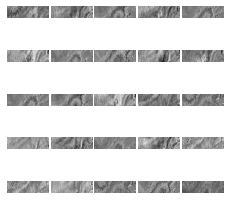

In [5]:
# plot supsets of each direction to visualize patterns in each direction
for dir in directions:
    j = 1
    np.random.seed(1)
    fig = plt.figure(figsize=(3,3)) 
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05) 
    for i in np.random.choice(100, 25):
        # plot a 8*8 imges 25 times
        plt.subplot(5,5,j), plt.imshow(data[dir][i].T, cmap='binary'), plt.axis('off')
        j += 1
    plt.show()

In [ ]:
"""
When looking at macroscopic patterns, we see that all do contain such patterns

"""

In [7]:
### Dimension reduction and visualization with PCA

flattten dirs (200, 178755) (701, 51000) (255, 140200)
dir inline (200, 178755) 200 200
0.25410255550374833
dir xline (701, 51000) 701 701
0.09931507451544633
dir tline (255, 140200) 255 255
0.10531954348068061


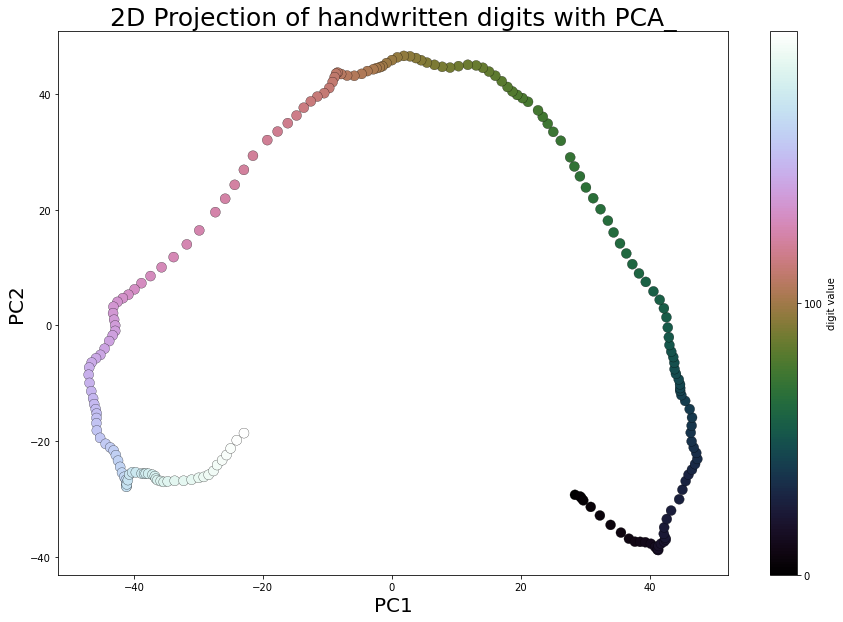

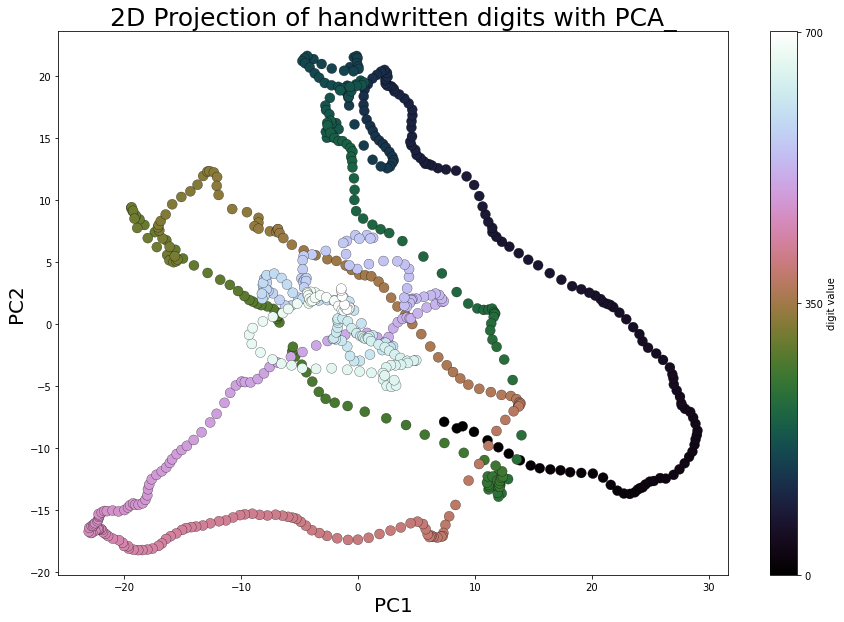

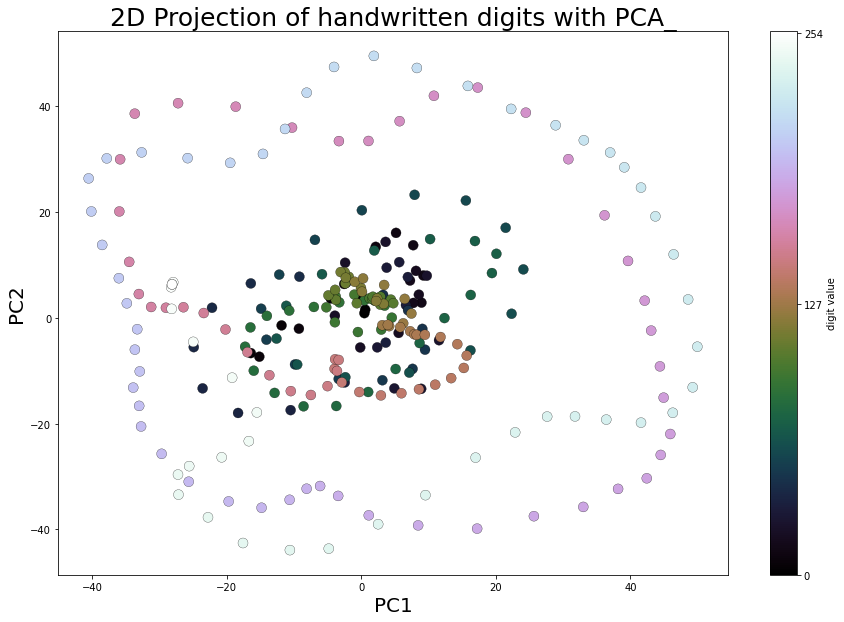

In [8]:
from sklearn.cluster import KMeans
# flatten directions 
data["inline"] = data["inline"].reshape(num_samples["inline"], -1)
data["xline"] = data["xline"].reshape(num_samples["xline"], -1)
data["tline"] = data["tline"].reshape(num_samples["tline"], -1)
print("flattten dirs", data["inline"].shape, data["xline"].shape, data["tline"].shape )
# perform PCA for each dir 

pca = {}

for dir in directions:
    print("dir", dir, data[dir].shape, len(labels[dir]), num_samples[dir])
    pca_digits=PCA(2)
    pca[dir] = pca_digits.fit_transform(data[dir]) 
    print(np.sum(pca_digits.explained_variance_ratio_))
    plt.figure(figsize=(15,10))
    # each image is projected to a x,y coordinate. 
    # scatter the different images with the original label 
    plt.scatter(pca[dir][:, 0], pca[dir][:, 1], lw=0.25, c=labels[dir], edgecolor='k',  s=100, cmap=plt.cm.get_cmap('cubehelix', num_samples[dir]))
    plt.xlabel('PC1', size=20), plt.ylabel('PC2', size=20), plt.title("2D Projection of handwritten digits with PCA_", size=25)
    plt.colorbar(ticks=np.arange(0,num_samples[dir],int(num_samples[dir]/2)), label='digit value')
    plt.clim(0,num_samples[dir])




pca[dir] (200, 2)
pca[dir] (701, 2)
pca[dir] (255, 2)


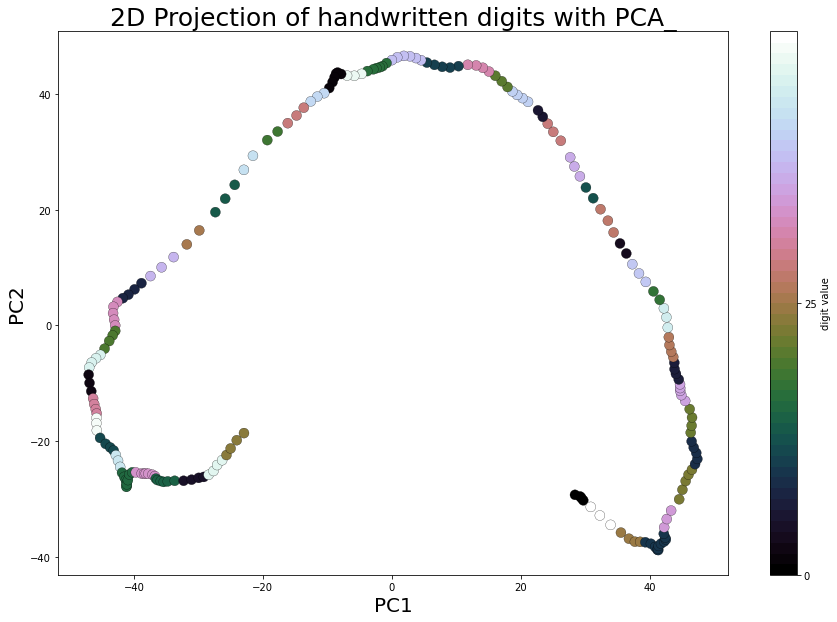

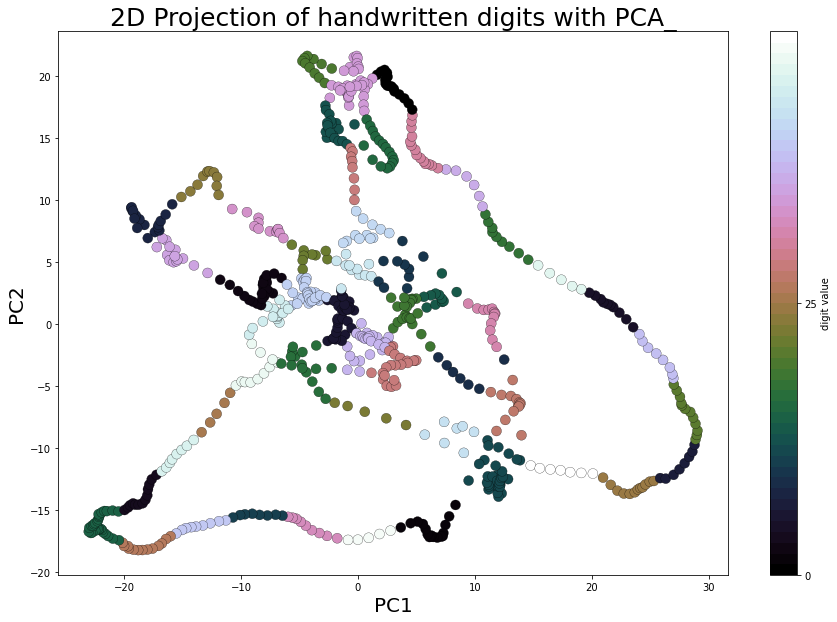

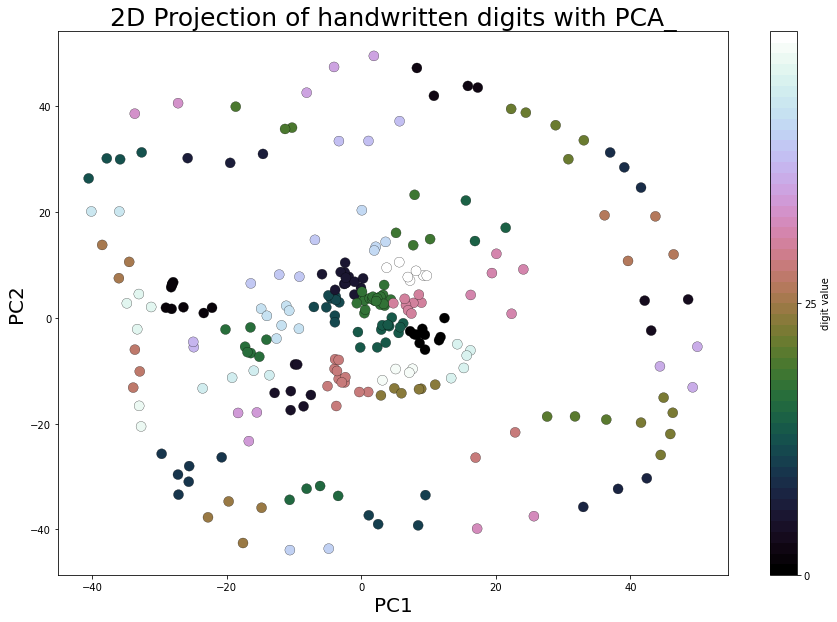

In [9]:
# perform k-means on each dir  to seperate into clusters?
n_clusters = 50

for dir in directions:
    print("pca[dir]", pca[dir].shape)
    k_means = KMeans(n_clusters, random_state=0)
    k_means.fit(pca[dir])
    values = k_means.cluster_centers_.squeeze()
    labels_kmeans = k_means.labels_

    plt.figure(figsize=(15,10))
    # each image is projected to a x,y coordinate. 
    # scatter the different images with the original label 
    plt.scatter(pca[dir][:, 0], pca[dir][:, 1], lw=0.25, c=labels_kmeans.tolist(), edgecolor='k',  s=100, cmap=plt.cm.get_cmap('cubehelix', n_clusters))
    plt.xlabel('PC1', size=20), plt.ylabel('PC2', size=20), plt.title("2D Projection of handwritten digits with PCA_", size=25)
    plt.colorbar(ticks=np.arange(0,n_clusters,int(n_clusters/2)), label='digit value')
    plt.clim(0,n_clusters)

In [ ]:
"""
When using pca to ptoject the data into 2D space, we see that 
every image is most similar to the next. This is evident in inline/xline, 
and is expected as we consider the directions to be continuous changing. The tline direction is a result 
of changes in bot iline and xline ansd is less linear. Among xline/inline
xline seem to have more distinc area in som e parts of the survye, and come reoccuring 
characterisitcts, indicated by the "lines" beeing almost as close to other indexes than the next in some parts of
the survey.

one could use this projection to estimate which slices is more similar by using eucledian distance 
from the projected points. 

TODO: TAKE A IMAGE AND FIND AND PLOT THE IMAGES THAT IS CLOSE TO SAID THAT SLICE BUT NOT CLOSE IN INDEX
"""

(701, 2)
Plottting:  inline


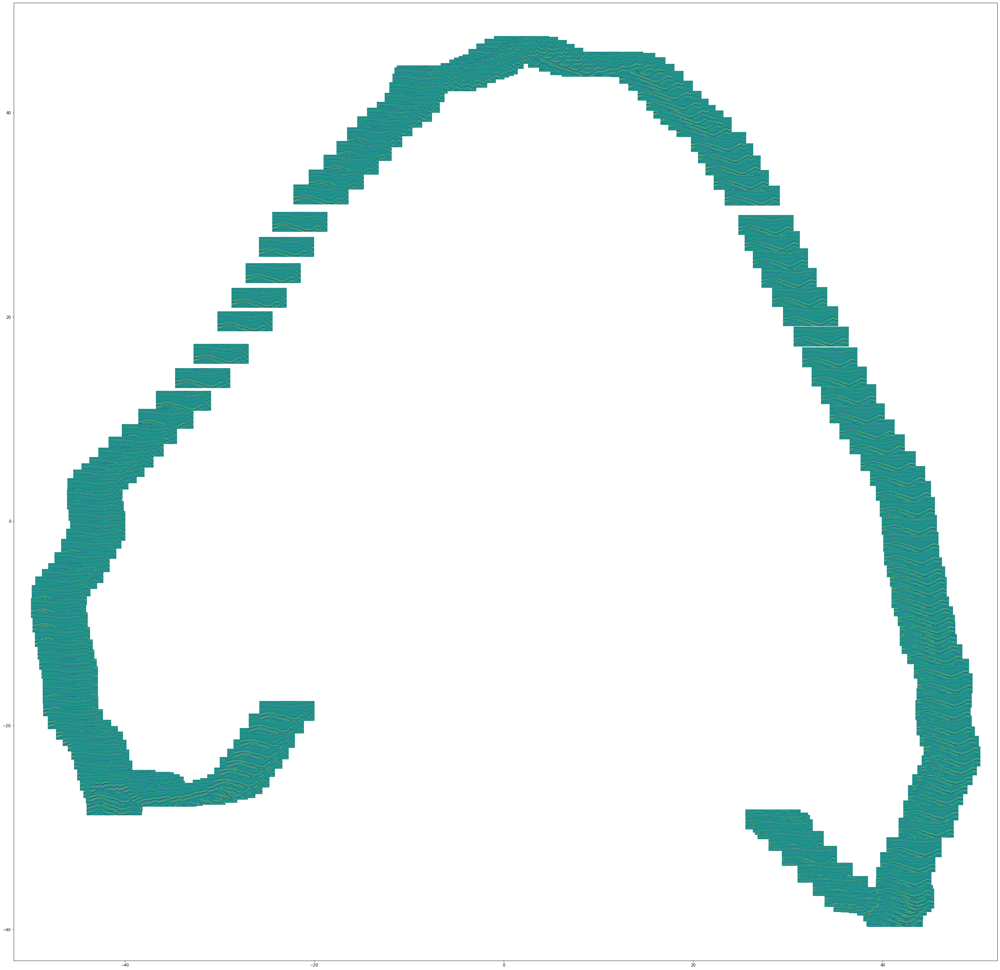

Plottting:  xline


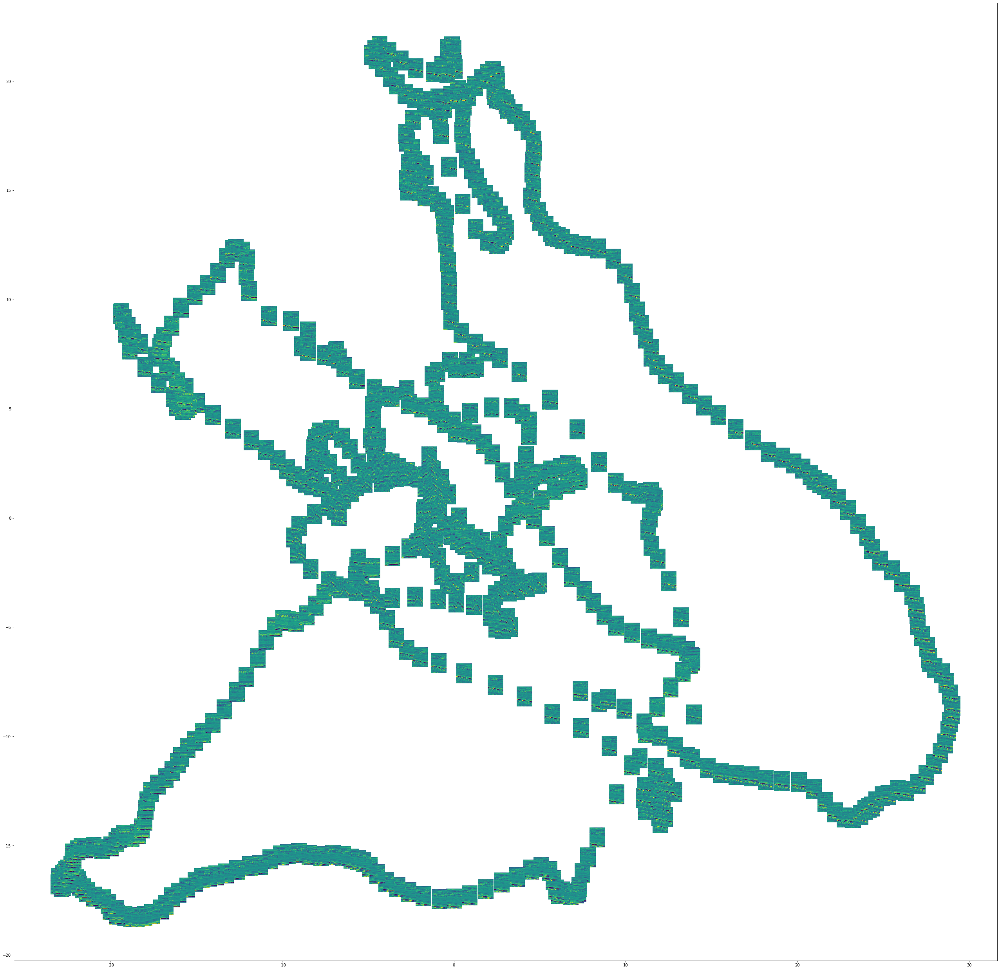

Plottting:  tline


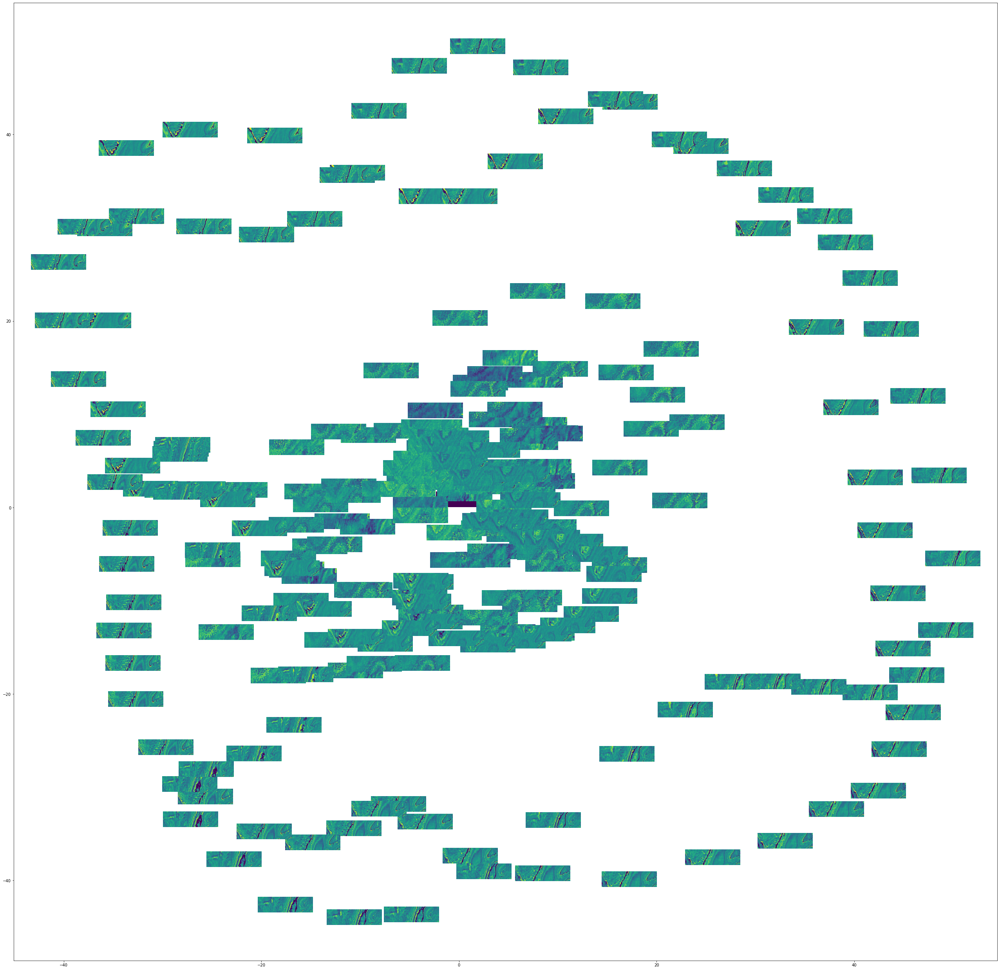

In [10]:
# visualise the scatterplot in actual images 
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

def visualize_scatter_with_images(X_2d_data, images, figsize=(45,45), image_zoom=1):
    fig, ax = plt.subplots(figsize=figsize)
    artists = []
    for xy, i in zip(X_2d_data, images):
        x0, y0 = xy
        img = OffsetImage(i, zoom=image_zoom)
        ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(X_2d_data)
    ax.autoscale()
    plt.show()
    
print(pca["xline"].shape)

shape={}
shape["inline"] = [xline_samples, tline_samples]
shape["xline"] = [inline_samples, tline_samples]
shape["tline"] = [xline_samples, inline_samples]

for dir in directions:
    print("Plottting: ", dir)
    images = data[dir]
    plots = pca[dir]
    dims = shape[dir]
    visualize_scatter_with_images(plots, images = [np.reshape(i, (dims[0],dims[1])).T for i in images], image_zoom=0.2)

In [ ]:
### Dimension reduction and visualization with TSNE


/usr/local/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.manifold.t_sne module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.manifold. Anything that cannot be imported from sklearn.manifold is now part of the private API.
  warnings.warn(message, FutureWarning)


dir inline (200, 178755) 200 200
dir xline (701, 51000) 701 701
dir tline (255, 140200) 255 255


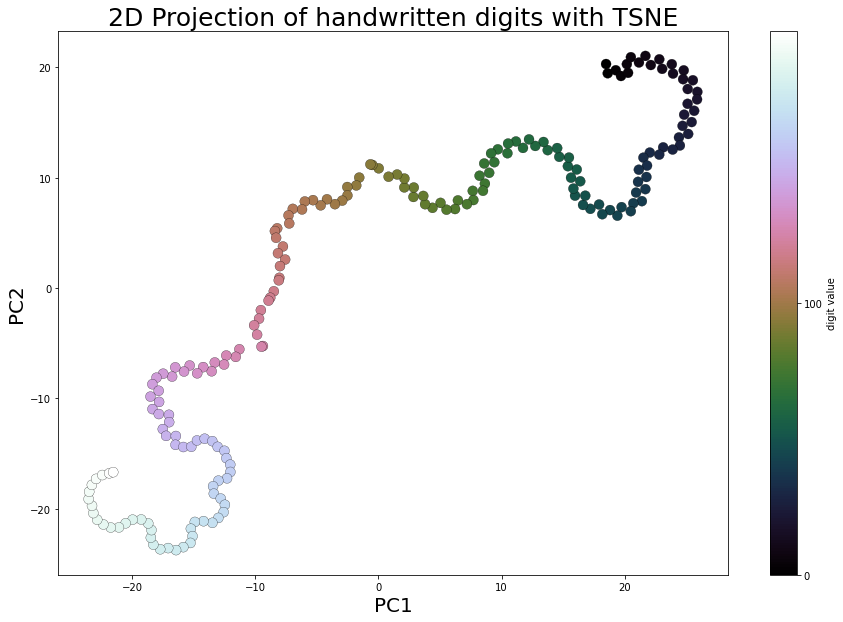

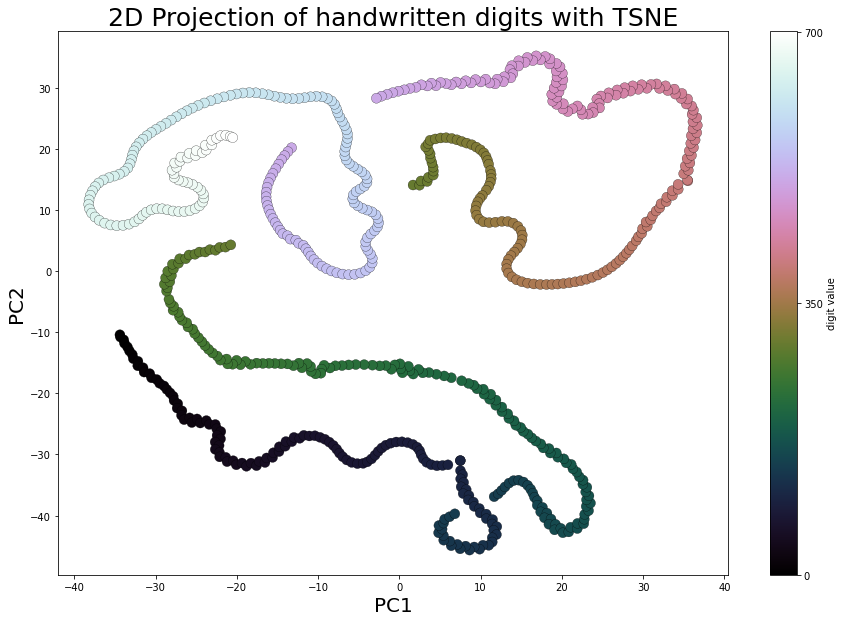

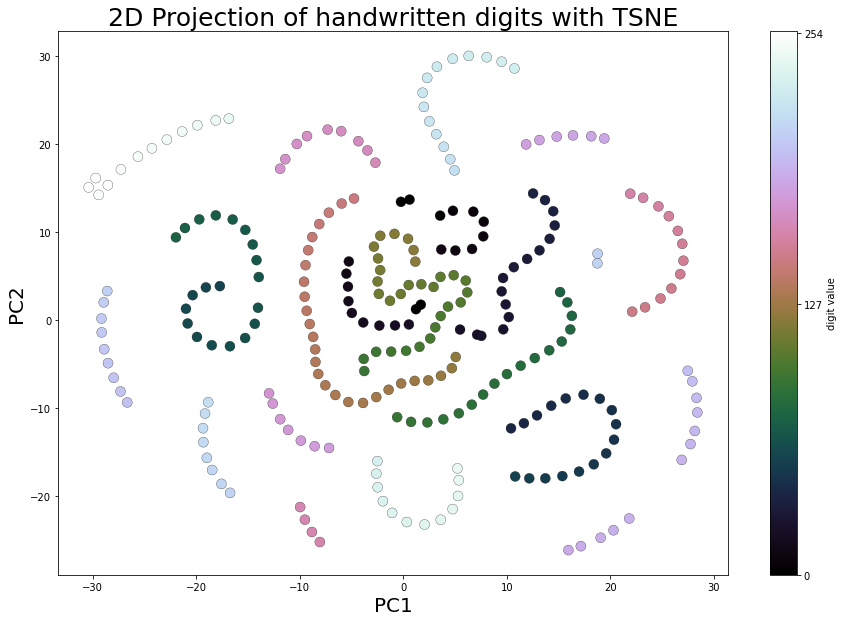

In [11]:
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.manifold import TSNE
from sklearn.manifold.t_sne import (_joint_probabilities,
                                    _kl_divergence)
# Random state we define this random state to use this value in TSNE which is a randmized algo.
RS = 25111993
T_SNE ={}
for dir in directions:
    print("dir", dir, data[dir].shape, len(labels[dir]), num_samples[dir])
    T_SNE[dir] = TSNE(random_state=RS).fit_transform(data[dir])
    plt.figure(figsize=(15,10))
    # each image is projected to a x,y coordinate. 
    # scatter the different images with the original label 
    plt.scatter(T_SNE[dir][:, 0], T_SNE[dir][:, 1], lw=0.25, c=labels[dir], edgecolor='k',  s=100, cmap=plt.cm.get_cmap('cubehelix', num_samples[dir]))
    plt.xlabel('PC1', size=20), plt.ylabel('PC2', size=20), plt.title('2D Projection of handwritten digits with TSNE', size=25)
    plt.colorbar(ticks=np.arange(0,num_samples[dir],int(num_samples[dir]/2)), label='digit value')
    plt.clim(0,num_samples[dir])

pca[dir] (200, 2)
pca[dir] (701, 2)
pca[dir] (255, 2)


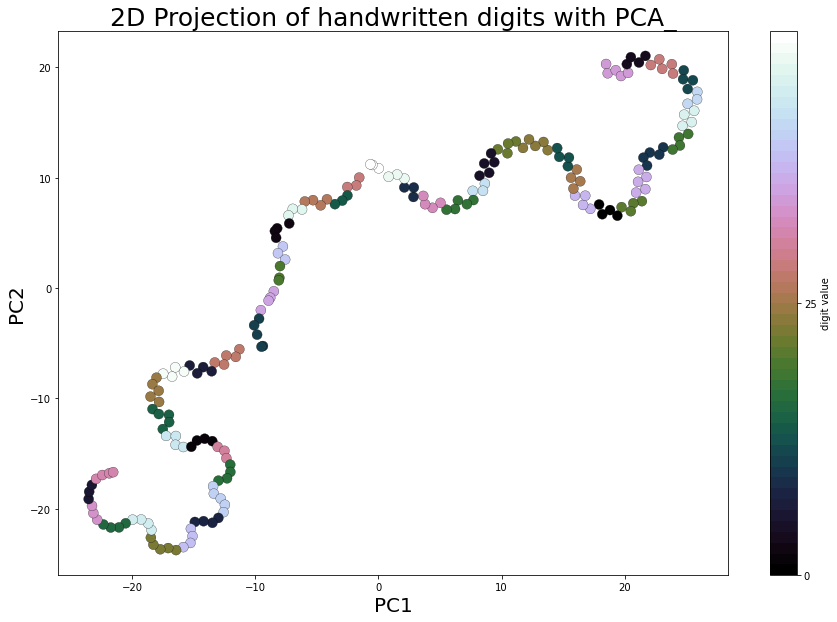

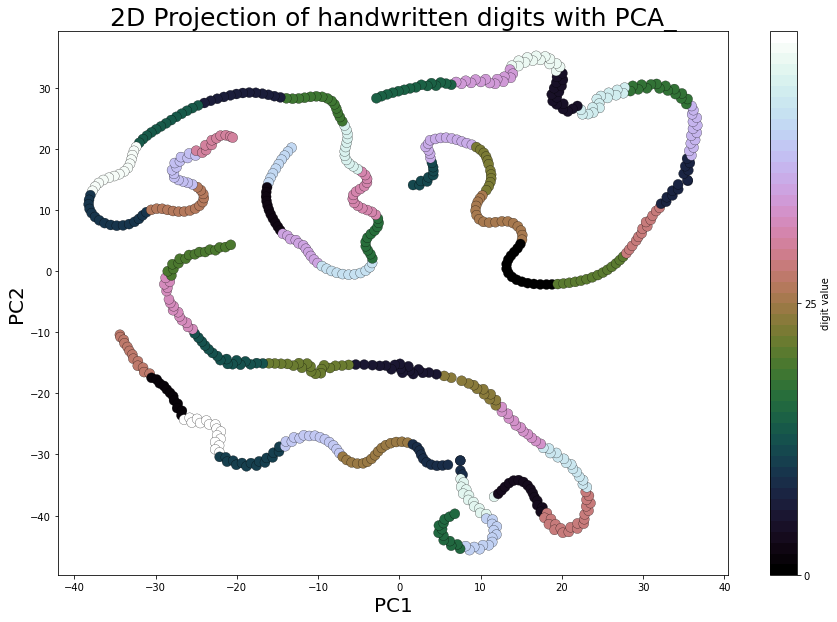

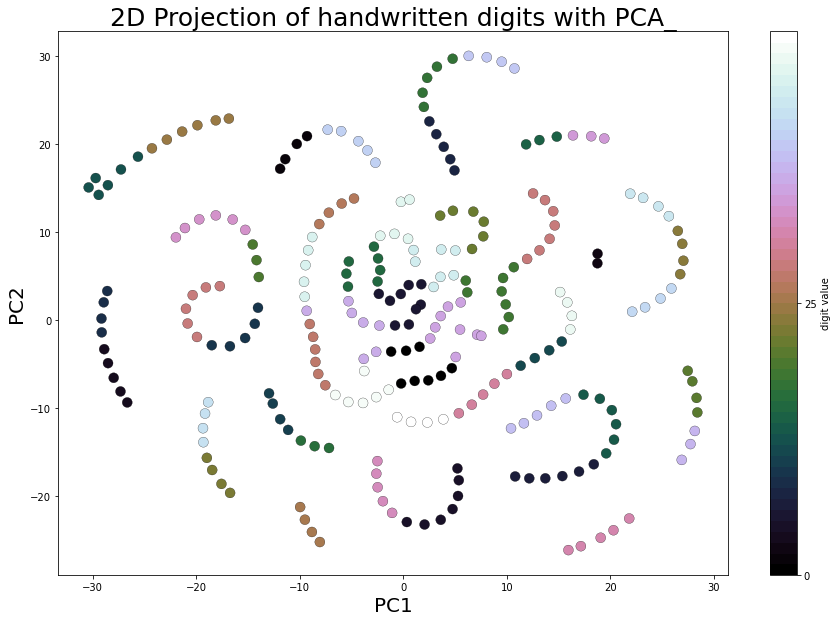

In [12]:
# perform k-means on each dir  to seperate into clusters?
n_clusters = 50

for dir in directions:
    print("pca[dir]", pca[dir].shape)
    k_means = KMeans(n_clusters, random_state=0)
    k_means.fit(T_SNE[dir])
    values = k_means.cluster_centers_.squeeze()
    labels_kmeans = k_means.labels_

    plt.figure(figsize=(15,10))
    # each image is projected to a x,y coordinate. 
    # scatter the different images with the original label 
    plt.scatter(T_SNE[dir][:, 0], T_SNE[dir][:, 1], lw=0.25, c=labels_kmeans.tolist(), edgecolor='k',  s=100, cmap=plt.cm.get_cmap('cubehelix', n_clusters))
    plt.xlabel('PC1', size=20), plt.ylabel('PC2', size=20), plt.title("2D Projection of handwritten digits with PCA_", size=25)
    plt.colorbar(ticks=np.arange(0,n_clusters,int(n_clusters/2)), label='digit value')
    plt.clim(0,n_clusters)

Plottting:  inline


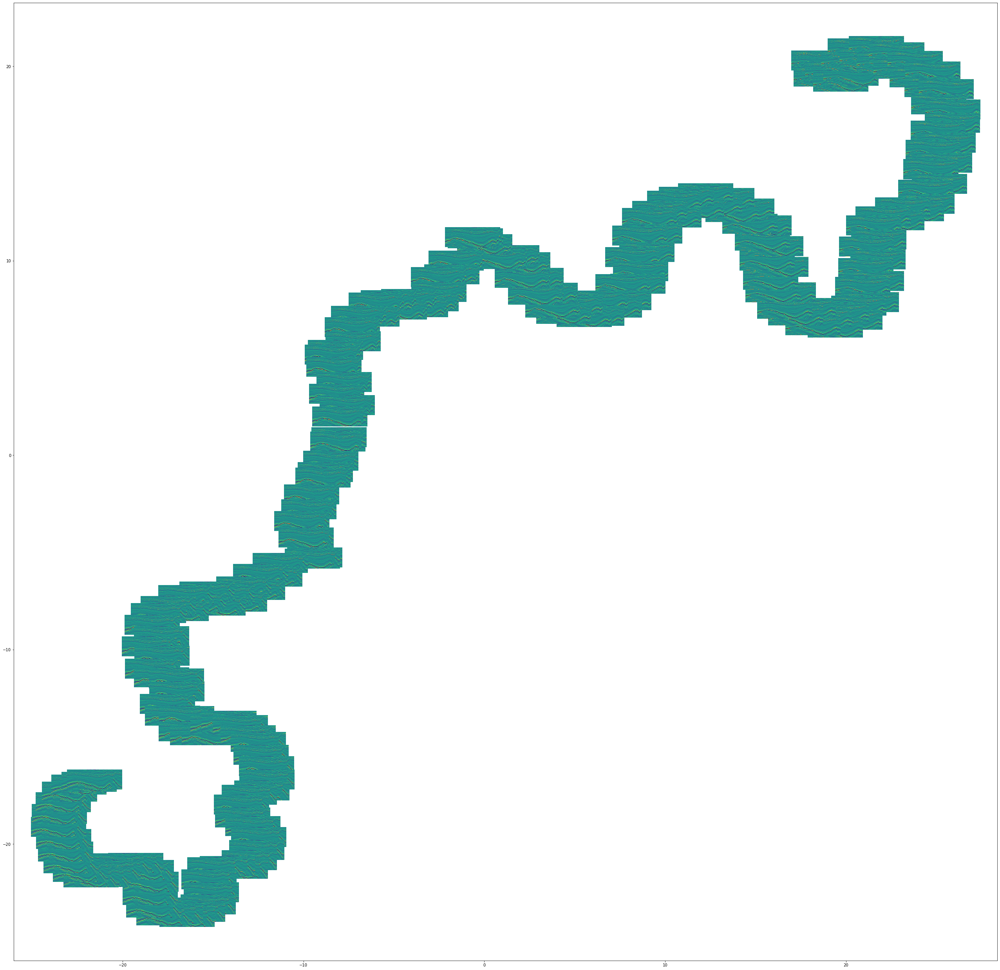

Plottting:  xline


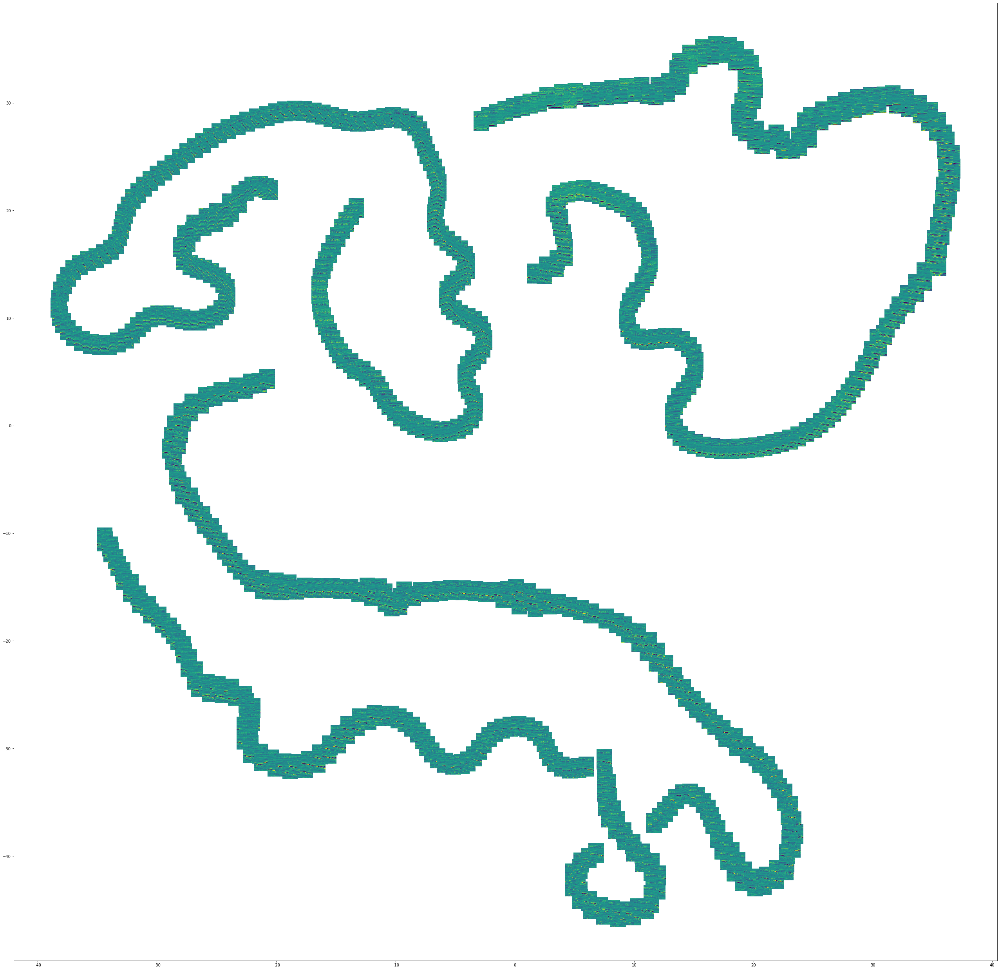

Plottting:  tline


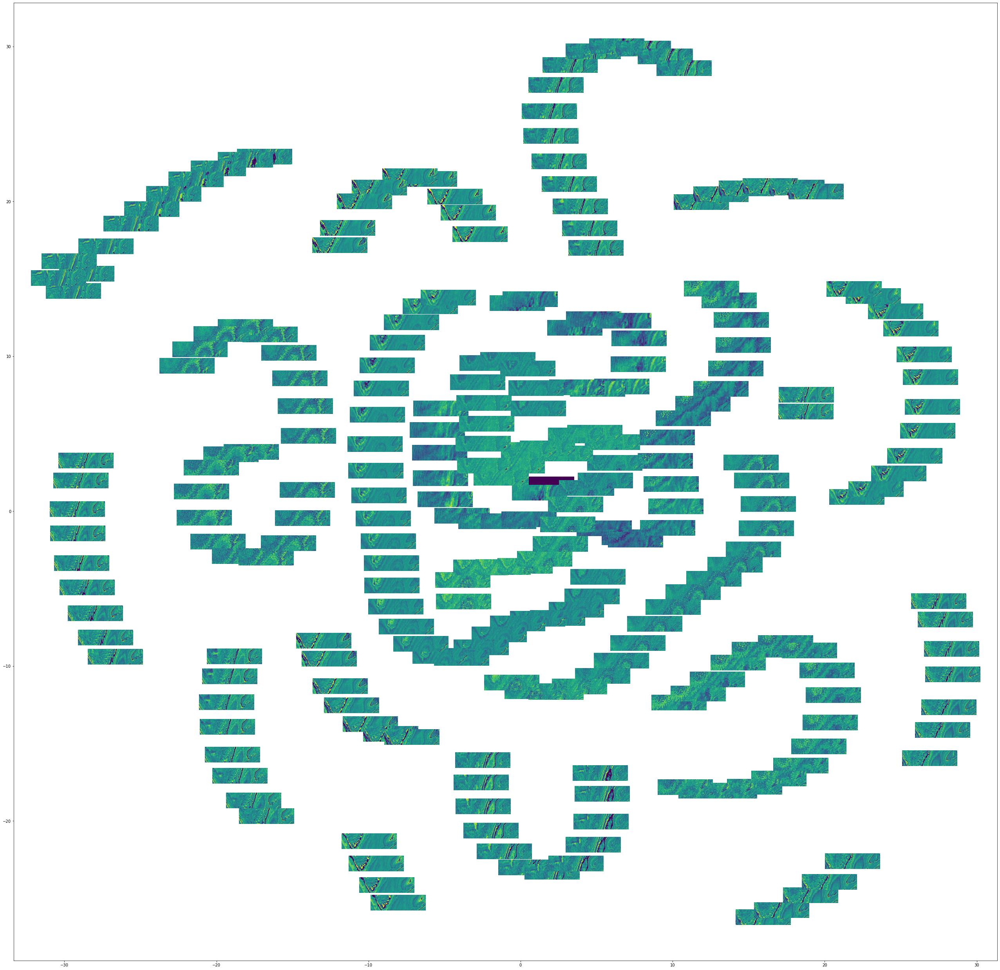

In [13]:
# visualise the scatterplot in actual images 

for dir in directions:
    print("Plottting: ", dir)
    images = data[dir]
    plots = T_SNE[dir]
    dims = shape[dir]
    visualize_scatter_with_images(plots, images = [np.reshape(i, (dims[0],dims[1])).T for i in images], image_zoom=0.2)

In [ ]:
### TRY KNN AND OTHER CLUSTERING THAN KMEANS TO EXPLOIT EUCLEDIAN DISTANCE IN PROJECTION SPACE 
### use a clustering algorithm that infers number of clusters. Kmeans splits unintuitvily becouse of the num_clusters are foreced to apply

In [ ]:
## do this process for induvidual patches and not only actual images

In [ ]:
### 5TSNE WITH PCA
